In [0]:
from pyspark.sql import SparkSession
spark=SparkSession.builder.appName("IPL").getOrCreate();

In [0]:
from pyspark.sql.types import StructType, StructField, IntegerType, StringType,DateType
matches_schema = StructType([
    StructField("id", IntegerType(), True),
    StructField("city", StringType(), True),
    StructField("date", DateType(), True),
    StructField("player_of_match", StringType(), True),
    StructField("venue", StringType(), True),
    StructField("neutral_venue", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("toss_decision", StringType(), True),
    StructField("winner", StringType(), True),
    StructField("result", StringType(), True),
    StructField("result_margin", StringType(), True),
    StructField("eliminator", StringType(), True),
    StructField("method", StringType(), True),
    StructField("umpire1", StringType(), True),
    StructField("umpire2", StringType(), True),
    StructField("umpire3", StringType(), True)
])


In [0]:
matches=spark.read.format("csv").option("header","true").schema(matches_schema).load("/FileStore/tables/matches.csv")

In [0]:
from pyspark.sql.functions import col,sum
matches.select([
    sum(col(c).isNull().cast("int")).alias(c)
    for c in matches.columns
]).display()

id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
matches.count()

Out[5]: 1095

In [0]:
matches.display(5)

id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2
335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140,223,20,N,NA,Asad Rauf,RE Koertzen
335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33,241,20,N,NA,MR Benson,SL Shastri
335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Daredevils,wickets,9,130,20,N,NA,Aleem Dar,GA Pratapkumar
335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bangalore,wickets,5,166,20,N,NA,SJ Davis,DJ Harper
335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5,111,20,N,NA,BF Bowden,K Hariharan
335987,2007/08,Jaipur,2008-04-21,League,SR Watson,Sawai Mansingh Stadium,Rajasthan Royals,Kings XI Punjab,Kings XI Punjab,bat,Rajasthan Royals,wickets,6,167,20,N,NA,Aleem Dar,RB Tiffin
335988,2007/08,Hyderabad,2008-04-22,League,V Sehwag,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Delhi Daredevils,Deccan Chargers,bat,Delhi Daredevils,wickets,9,143,20,N,NA,IL Howell,AM Saheba
335989,2007/08,Chennai,2008-04-23,League,ML Hayden,"MA Chidambaram Stadium, Chepauk",Chennai Super Kings,Mumbai Indians,Mumbai Indians,field,Chennai Super Kings,runs,6,209,20,N,NA,DJ Harper,GA Pratapkumar
335990,2007/08,Hyderabad,2008-04-24,League,YK Pathan,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Rajasthan Royals,Rajasthan Royals,field,Rajasthan Royals,wickets,3,215,20,N,NA,Asad Rauf,MR Benson
335991,2007/08,Chandigarh,2008-04-25,League,KC Sangakkara,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Mumbai Indians,Mumbai Indians,field,Kings XI Punjab,runs,66,183,20,N,NA,Aleem Dar,AM Saheba


In [0]:
matches.filter(col("method")!="NA").count()

Out[7]: 21

In [0]:
from pyspark.sql.functions import *
matches=matches.withColumn(
    "toss impact",when(col("toss_winner")==col("winner"), "Y").otherwise("N")
    )
matches.display()

id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2,toss impact
335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140,223,20,N,NA,Asad Rauf,RE Koertzen,N
335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33,241,20,N,NA,MR Benson,SL Shastri,Y
335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Daredevils,wickets,9,130,20,N,NA,Aleem Dar,GA Pratapkumar,N
335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bangalore,wickets,5,166,20,N,NA,SJ Davis,DJ Harper,N
335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5,111,20,N,NA,BF Bowden,K Hariharan,N
335987,2007/08,Jaipur,2008-04-21,League,SR Watson,Sawai Mansingh Stadium,Rajasthan Royals,Kings XI Punjab,Kings XI Punjab,bat,Rajasthan Royals,wickets,6,167,20,N,NA,Aleem Dar,RB Tiffin,N
335988,2007/08,Hyderabad,2008-04-22,League,V Sehwag,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Delhi Daredevils,Deccan Chargers,bat,Delhi Daredevils,wickets,9,143,20,N,NA,IL Howell,AM Saheba,N
335989,2007/08,Chennai,2008-04-23,League,ML Hayden,"MA Chidambaram Stadium, Chepauk",Chennai Super Kings,Mumbai Indians,Mumbai Indians,field,Chennai Super Kings,runs,6,209,20,N,NA,DJ Harper,GA Pratapkumar,N
335990,2007/08,Hyderabad,2008-04-24,League,YK Pathan,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Rajasthan Royals,Rajasthan Royals,field,Rajasthan Royals,wickets,3,215,20,N,NA,Asad Rauf,MR Benson,Y
335991,2007/08,Chandigarh,2008-04-25,League,KC Sangakkara,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Mumbai Indians,Mumbai Indians,field,Kings XI Punjab,runs,66,183,20,N,NA,Aleem Dar,AM Saheba,N


In [0]:
total_match=matches.count()
total_win_match=matches.filter(col("toss impact")=="Y").count()
percentage=(total_win_match/total_match)*100
print("the toss impacted match out come is ", percentage)

the toss impacted match out come is  50.593607305936075


Out[63]: Text(0.5, 1.0, 'result graph ')

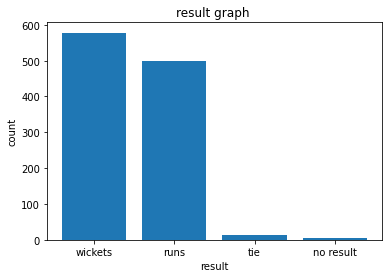

In [0]:
result_count=matches.groupBy("result").count()
result_count_pd=result_count.toPandas()
plt.bar(result_count_pd["result"],result_count_pd["count"])
plt.xlabel("result")
plt.ylabel("count")
plt.title("result graph ")

Out[66]: Text(0.5, 1.0, 'toss decision distribution')

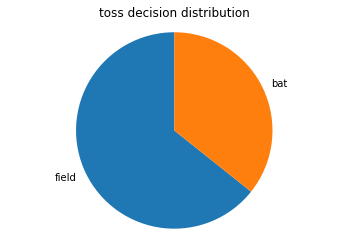

In [0]:
toss_decision=matches.groupBy("toss_decision").count().toPandas()
plt.pie(toss_decision["count"],labels=toss_decision["toss_decision"],startangle=90)
plt.axis("equal")
plt.title("toss decision distribution")


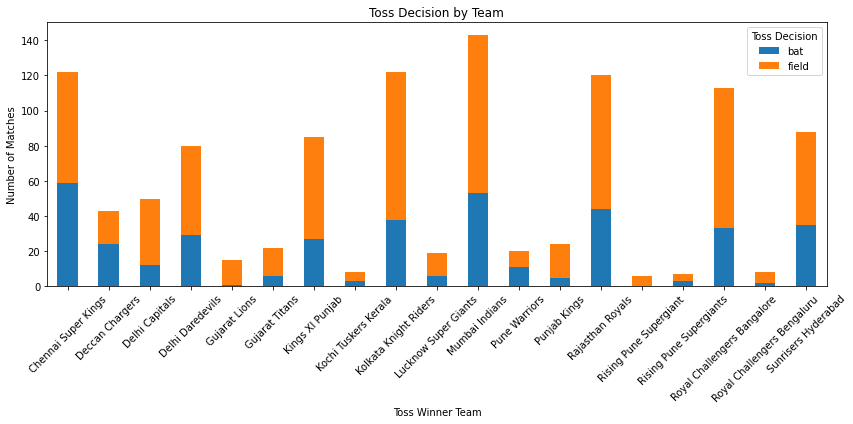

In [0]:
import matplotlib.pyplot as plt
team_toss_decision = matches.groupBy("toss_winner", "toss_decision").count().toPandas()
pivot_df = team_toss_decision.pivot(index='toss_winner', columns='toss_decision', values='count').fillna(0)
pivot_df.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title("Toss Decision by Team")
plt.xlabel("Toss Winner Team")
plt.ylabel("Number of Matches")
plt.xticks(rotation=45)
plt.legend(title="Toss Decision")
plt.tight_layout()
plt.show()


In [0]:
import plotly.graph_objs as go
import pandas as pd

# 1. Convert Spark DataFrame to Pandas
season_team_wins = matches.groupBy("season", "winner").count().orderBy("season").toPandas()

# 2. Pivot to wide format
pivot_df = season_team_wins.pivot(index='season', columns='winner', values='count').fillna(0)

# 3. Prepare data for Plotly
seasons = pivot_df.index.tolist()
teams = pivot_df.columns.tolist()

# Create a trace for each team (but initially only show the first team)
data = []
for i, team in enumerate(teams):
    visible = True if i == 0 else False
    data.append(go.Scatter(
        x=seasons,
        y=pivot_df[team],
        mode='lines+markers',
        name=team,
        visible=visible
    ))

# 4. Create dropdown menu buttons for teams
buttons = []
for i, team in enumerate(teams):
    visibility = [False] * len(teams)
    visibility[i] = True  # Only one team visible at a time
    buttons.append(dict(
        label=team,
        method='update',
        args=[{'visible': visibility},
              {'title': f"{team} Wins per Season"}]
    ))

# 5. Create the layout with dropdown
layout = go.Layout(
    title=f"{teams[0]} Wins per Season",
    xaxis=dict(title='Season'),
    yaxis=dict(title='Number of Wins'),
    updatemenus=[dict(
        active=0,
        buttons=buttons,
        x=0.1,
        y=1.15,
        xanchor='left',
        yanchor='top'
    )]
)

fig = go.Figure(data=data, layout=layout)
fig.show()


In [0]:
deliveries_df=spark.read.format("csv").option("InferSchema","true").option("header","true").load("/FileStore/tables/deliveries.csv")

In [0]:
deliveries_df.display()

match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,BB McCullum,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,3,BB McCullum,P Kumar,SC Ganguly,0,1,1,wides,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,6,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,7,BB McCullum,P Kumar,SC Ganguly,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,1,BB McCullum,Z Khan,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,2,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,3,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA


In [0]:
deliveries_df.select([
        sum(col(c).isNull().cast("int")).alias(c)
        for c in deliveries_df.columns
]).display()

match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
0,0,0,0,0,0,0,0,0,0,0,0,246795,0,0,0,0


In [0]:
deliveries_df= deliveries_df.orderBy(
    col("match_id").cast("int"),
    col("inning").cast("int"),
    col("over").cast("int"),
    col("ball").cast("int")
)

In [0]:
deliveries_df.display()

match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,BB McCullum,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,3,BB McCullum,P Kumar,SC Ganguly,0,1,1,wides,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,6,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,7,BB McCullum,P Kumar,SC Ganguly,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,1,BB McCullum,Z Khan,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,2,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,3,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA


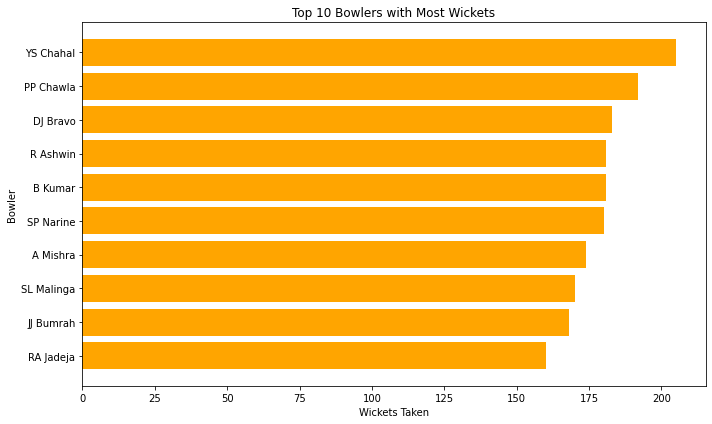

In [0]:
from pyspark.sql.functions import col
import matplotlib.pyplot as plt

# 1. Filter out valid dismissals attributed to a bowler
invalid_dismissals = [
    'bowled', 'caught', 'lbw', 'stumped', 'caught and bowled', 'hit wicket'
]

wickets_df = deliveries_df.filter(
    ~col("dismissal_kind").isin(["NA","run out"])
).filter(
    col("player_dismissed").isNotNull()
)

# 2. Count wickets per bowler
top_bowlers = wickets_df.groupBy("bowler").count().orderBy(col("count").desc()).limit(10)

# 3. Convert to Pandas for plotting
top_bowlers_pd = top_bowlers.toPandas()

# 4. Plot using matplotlib
plt.figure(figsize=(10, 6))
plt.barh(top_bowlers_pd['bowler'], top_bowlers_pd['count'], color='orange')
plt.xlabel("Wickets Taken")
plt.ylabel("Bowler")
plt.title("Top 10 Bowlers with Most Wickets")
plt.gca().invert_yaxis()  # Show highest at top
plt.tight_layout()
plt.show()


In [0]:
top_scorer=(deliveries_df.groupBy("batter")
            .sum("batsman_runs")
            .withColumnRenamed("sum(batsman_runs)","total score")
            .orderBy(col("total score").desc())
            .limit(10)
)

In [0]:
top_scorer.display()

batter,total score
V Kohli,8014
S Dhawan,6769
RG Sharma,6630
DA Warner,6567
SK Raina,5536
MS Dhoni,5243
AB de Villiers,5181
CH Gayle,4997
RV Uthappa,4954
KD Karthik,4843


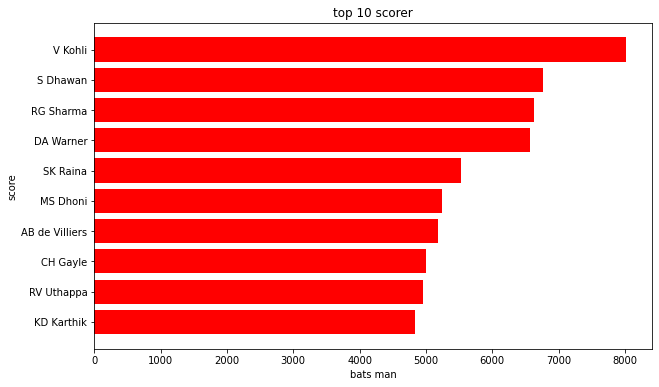

In [0]:
top_scorer_pd=top_scorer.toPandas()
plt.figure(figsize=(10,6))
plt.barh(top_scorer_pd["batter"],top_scorer_pd["total score"],color="red")
plt.xlabel("bats man")
plt.ylabel("score")
plt.gca().invert_yaxis()
plt.title("top 10 scorer")
plt.show()